## Practical Work 4

For this practical work, the student will have to develop a Python program that is able to implement the accelerated gradient descent methods with adaptive learning rate <b>(Adagrad, RMSProp, and Adam)</b> in order to achieve the linear regression of a set of datapoints.
##### Please notice that we will apply these algorithm to single variable LR.

#### Import numpy, matplotlib.pyplot and make it inline

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
from sklearn.metrics import r2_score
%matplotlib inline

#### Functions

In [2]:
def Loss_Epochs_plot(X, Y, xlabel, ylabel):
    fig = plt.figure()
    plt.plot(X, Y, marker = 'o')
    plt.grid(linewidth = 0.3)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(f"{ylabel} Vs. {xlabel}")
    
def regression_lines_plot(X, Y, xlabel, ylabel):
    plt.plot(X, Y, 'r')
    plt.grid(linewidth = 0.3)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(f"{ylabel} Vs. {xlabel}")
    
def training_report(a , b, c, d, e, f, g):
    print("\n****************** Training Report ********************\n")
    print(f"Gradient Descent converged after {int(a)} epochs")
    print(f"\ntheta_0_Opt : {b}\ntheta_1_Opt : {c}")
    print("\nError Vector:\n", d)
    print("\nCost = ", e)
    print("\nh(x) = y_predict:\n", f)
    print("\ny_actual:\n", g)
    
def all_plots(m, X, Y, Y_pred):
    theta_0 = m[:, 1]
    theta_1 = m[:, 2]

    cost = m[:, 3]
    x = m[:, 0]
    fig = plt.figure()
    Loss_Epochs_plot(x, cost, 'Ephocs', 'Loss')

    Loss_Epochs_plot(theta_0, cost, 'theta_0', "Loss")
    plt.title("Learning Rate = 0.0005")
    Loss_Epochs_plot(theta_1, cost, "theta_1", "Loss")
    plt.title("Learning Rate = 0.0005")

    fig = plt.figure()
    plt.plot(X, Y, 'ob')
    for i in Y_pred:
        regression_lines_plot(X, i, "x", "y")
    
    fig = plt.figure()
    plt.plot(X, Y, 'ob', markersize = 4)
    regression_lines_plot(X, Y_pred[-1], "x", "y")

To have a dataset or set of data points, the student must generate a pair of arrays <b>X</b> and <b>y</b> with the values in <b>X</b> equally distributed between <b>0</b> and <b>20</b> and the values in <b>y</b> such that: 
<b>yi = a*xi + b (and a = -1, b = 2)</b>


In [3]:
X = np.linspace(0,20)
X

array([ 0.        ,  0.40816327,  0.81632653,  1.2244898 ,  1.63265306,
        2.04081633,  2.44897959,  2.85714286,  3.26530612,  3.67346939,
        4.08163265,  4.48979592,  4.89795918,  5.30612245,  5.71428571,
        6.12244898,  6.53061224,  6.93877551,  7.34693878,  7.75510204,
        8.16326531,  8.57142857,  8.97959184,  9.3877551 ,  9.79591837,
       10.20408163, 10.6122449 , 11.02040816, 11.42857143, 11.83673469,
       12.24489796, 12.65306122, 13.06122449, 13.46938776, 13.87755102,
       14.28571429, 14.69387755, 15.10204082, 15.51020408, 15.91836735,
       16.32653061, 16.73469388, 17.14285714, 17.55102041, 17.95918367,
       18.36734694, 18.7755102 , 19.18367347, 19.59183673, 20.        ])

In [4]:
a=-1
b=2
y=a*X+b
y

array([  2.        ,   1.59183673,   1.18367347,   0.7755102 ,
         0.36734694,  -0.04081633,  -0.44897959,  -0.85714286,
        -1.26530612,  -1.67346939,  -2.08163265,  -2.48979592,
        -2.89795918,  -3.30612245,  -3.71428571,  -4.12244898,
        -4.53061224,  -4.93877551,  -5.34693878,  -5.75510204,
        -6.16326531,  -6.57142857,  -6.97959184,  -7.3877551 ,
        -7.79591837,  -8.20408163,  -8.6122449 ,  -9.02040816,
        -9.42857143,  -9.83673469, -10.24489796, -10.65306122,
       -11.06122449, -11.46938776, -11.87755102, -12.28571429,
       -12.69387755, -13.10204082, -13.51020408, -13.91836735,
       -14.32653061, -14.73469388, -15.14285714, -15.55102041,
       -15.95918367, -16.36734694, -16.7755102 , -17.18367347,
       -17.59183673, -18.        ])

#### Plot X vs. y

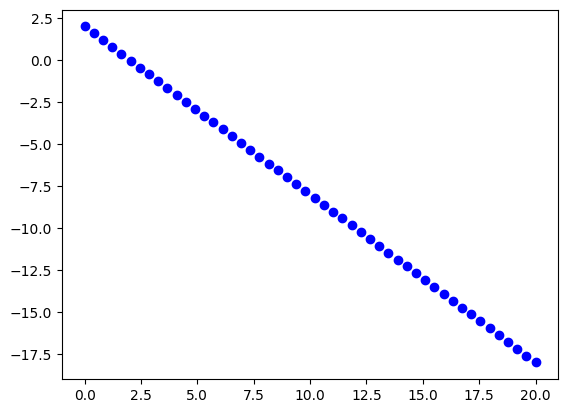

In [5]:
plt.plot(X, y, 'ob')

## Adagrad

### For a single variable linear regression ML model, build a function to find the optimum Theta_0 and Theta_1 parameters using Adagrad optimization algorithm.
#### The funtion should have the following input parameters:
##### 1. Input data as a matrix (or vector based on your data).
##### 2. Target label as a vector.
##### 3. Learning rate.
##### 4. Epsilon.
##### 5. Maximum number of iterations (Epochs).
#### The funtion should return the following outputs:
##### 1. All predicted Theta_0 in all iterations.
##### 2. All predicted Theta_1 in all iterations.
##### 3. Corresponding loss for each Theta_0 and Theta_1 predictions.
##### 4.All hypothesis outputs (prdicted labels) for each Theta_0 and Theta_1 predictions.
##### 5.Final Optimum values of Theta_0 and Theta_1.
#### Choose the suitable number of iterations, learning rate, Epsilon, and stop criteria.
#### Calculate r2 score. Shouldn't below 0.9
#### Plot the required curves (loss-epochs, loss-theta0, loss-theta1, all fitted lines per epoch (single graph), best fit line)
#### Try different values of the huperparameters and see the differnce in your results.

In [6]:
def Adagrad_single_var(X, Y, LR, epsilon, Max_iter):
    # step_1
    theta_0 = 0
    theta_1 = 0
    eps = epsilon
    V_t_0 = 0
    V_t_1 = 0
    m = len(X)
    Y_pred = []
    Thetas_Cost = []
        
    for i in range(Max_iter):
        print(f"\n****************** Iteration {i} ********************")
    # step_2:
        y_pred = theta_0 + (theta_1*X)
        print("\nh(x):\n", y_pred)
        Y_pred.append(y_pred)
        
    # step_3
        Error = y_pred - Y
        cost = (1/(2*m)) * (Error @ Error)   
        print("\nError Vector:\n", Error)
        print("\nj: ", cost)
        
        Thetas_Cost.append([i, theta_0, theta_1, cost])         # append values of thetas and cost 
    
    # step_4
        d_theta_0 = (1/m) * sum(Error * 1)
        d_theta_1 = (1/m) * sum(Error * X)
        GV = [[d_theta_0], 
             [d_theta_1]]
        GV_norm = np.linalg.norm(GV)
        print("\nGradient Vector:\n", GV)
        print("\nGradient Vector Norm:\n", GV_norm)
        
        if (GV_norm < 0.001) or ((i > 0) and (abs(Thetas_Cost[i][3] - Thetas_Cost[i-1][3])) < 0.001):       # (Gradient Check, convergence check)
            break
    
    # step_5
        V_t_0 = V_t_0 + (d_theta_0)**2
        V_t_1 = V_t_1 + (d_theta_1)**2
        theta_0 = theta_0 - ((LR/(np.sqrt(V_t_0) + eps)) * d_theta_0)
        theta_1 = theta_1 - ((LR/(np.sqrt(V_t_1) + eps)) * d_theta_1)
        print("\nV_t_0: ", V_t_0)
        print("V_t_1: ", V_t_1)
        print("\ntheta_0_new: ", theta_0)
        print("theta_1_new: ", theta_1)
    
    return np.array(Thetas_Cost), Error, np.array(Y_pred), [theta_0, theta_1]
    

##### The following results uses alpha = 0.05, epsilon =  1e-08, and max. iterations = 500.

In [7]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adagrad_single_var(X, y, 0.05, 1e-08, 500)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

V_t_0:  64.0
V_t_1:  13154.685547688467

the


Gradient Vector:
 [[-0.4686641803812695], [2.699208092252019]]

Gradient Vector Norm:
 2.7395931156380193

V_t_0:  1128.1393999214931
V_t_1:  285489.1896556718

theta_0_new:  -0.596829126945594
theta_1_new:  -0.7873663256056362

****************** Iteration 264 ********************

h(x):
 [ -0.59682913  -0.91820314  -1.23957715  -1.56095116  -1.88232517
  -2.20369918  -2.52507319  -2.8464472   -3.16782121  -3.48919522
  -3.81056923  -4.13194324  -4.45331725  -4.77469126  -5.09606527
  -5.41743928  -5.73881329  -6.0601873   -6.38156132  -6.70293533
  -7.02430934  -7.34568335  -7.66705736  -7.98843137  -8.30980538
  -8.63117939  -8.9525534   -9.27392741  -9.59530142  -9.91667543
 -10.23804944 -10.55942345 -10.88079746 -11.20217147 -11.52354548
 -11.84491949 -12.1662935  -12.48766751 -12.80904152 -13.13041553
 -13.45178954 -13.77316356 -14.09453757 -14.41591158 -14.73728559
 -15.0586596  -15.38003361 -15.70140762 -16.02278163 -16.34415564]

Error Vector:
 [-2.59682913 -2.51003987 -2.423

In [8]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.9484638125790851


<Figure size 640x480 with 0 Axes>

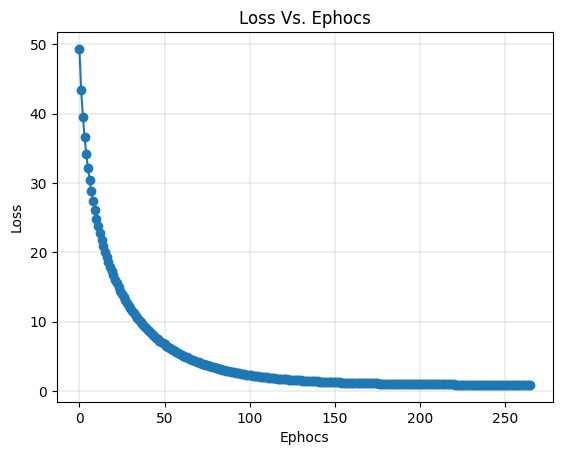

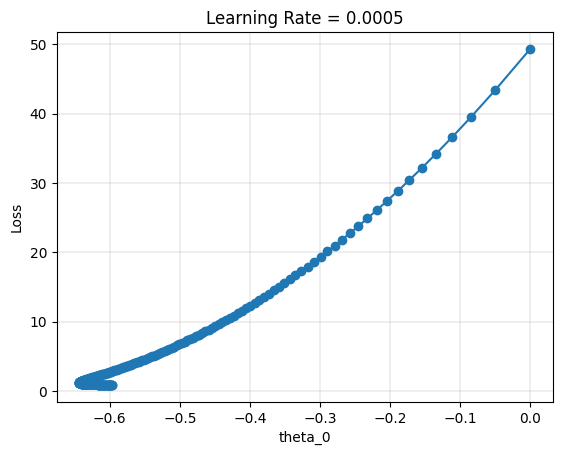

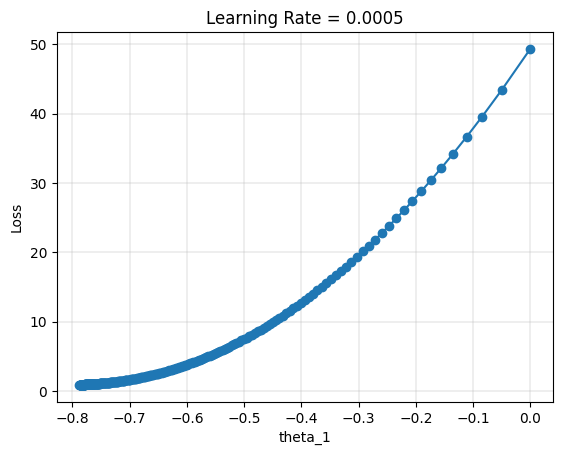

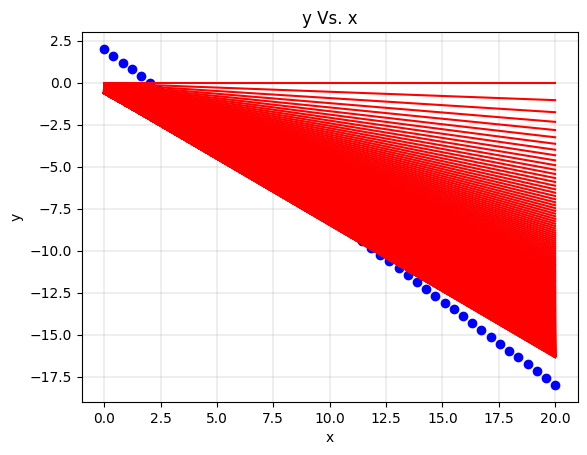

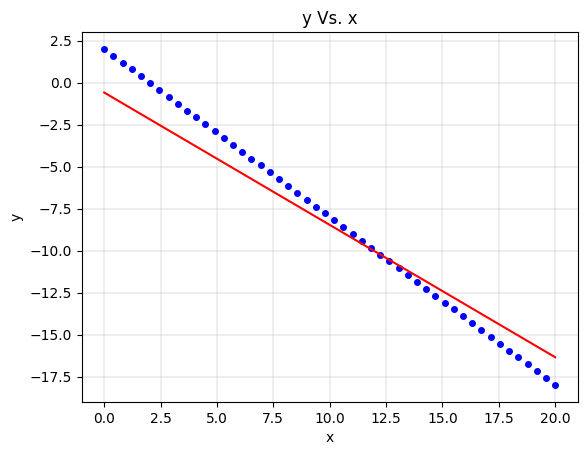

In [9]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

##### The following results uses alpha = 0.005, epsilon =  1e-08, and max. iterations = 5000.

In [10]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adagrad_single_var(X, y, 0.005, 1e-08, 5000)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

V_t_0:  64.0
V_t_1:  13154.685547688467

the

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Gradient Vector:
 [[3.0985623059070653], [50.190566611164314]]

Gradient Vector Norm:
 50.286121993183265

V_t_0:  62127.41754490838
V_t_1:  14154385.36990174

theta_0_new:  -0.4370424041347523
theta_1_new:  -0.44651244786357264

****************** Iteration 2756 ********************

h(x):
 [-0.4370424  -0.61929238 -0.80154236 -0.98379234 -1.16604232 -1.3482923
 -1.53054228 -1.71279226 -1.89504223 -2.07729221 -2.25954219 -2.44179217
 -2.62404215 -2.80629213 -2.98854211 -3.17079208 -3.35304206 -3.53529204
 -3.71754202 -3.899792   -4.08204198 -4.26429196 -4.44654194 -4.62879191
 -4.81104189 -4.99329187 -5.17554185 -5.35779183 -5.54004181 -5.72229179
 -5.90454177 -6.08679174 -6.26904172 -6.4512917  -6.63354168 -6.81579166
 -6.99804164 -7.18029162 -7.3625416  -7.54479157 -7.72704155 -7.90929153
 -8.09154151 -8.27379149 -8.45604147 -8.63829145 -8.82054143 -9.0027914
 -9.18504138 -9.36729136]

Error Vector:
 [-2.4370424  -2.21112912 -1.98521583 -1.75930254 -1.53338926 -1.30747597
 -1.08156

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




****************** Training Report ********************

Gradient Descent converged after 5000 epochs

theta_0_Opt : -0.5400968829191175
theta_1_Opt : -0.5615340004045978

Error Vector:
 [-2.54006332 -2.36108141 -2.18209951 -2.00311761 -1.82413571 -1.64515381
 -1.46617191 -1.28719001 -1.10820811 -0.92922621 -0.75024431 -0.57126241
 -0.39228051 -0.21329861 -0.03431671  0.14466519  0.32364709  0.50262899
  0.68161089  0.86059279  1.03957469  1.2185566   1.3975385   1.5765204
  1.7555023   1.9344842   2.1134661   2.292448    2.4714299   2.6504118
  2.8293937   3.0083756   3.1873575   3.3663394   3.5453213   3.7243032
  3.9032851   4.082267    4.2612489   4.4402308   4.6192127   4.79819461
  4.97717651  5.15615841  5.33514031  5.51412221  5.69310411  5.87208601
  6.05106791  6.23004981]

Cost =  5.03759450936735

h(x) = y_predict:
 [ -0.54006332  -0.76924468  -0.99842604  -1.22760741  -1.45678877
  -1.68597014  -1.9151515   -2.14433287  -2.37351423  -2.6026956
  -2.83187696  -3.06105833  

In [11]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.7095974929894115


<Figure size 640x480 with 0 Axes>

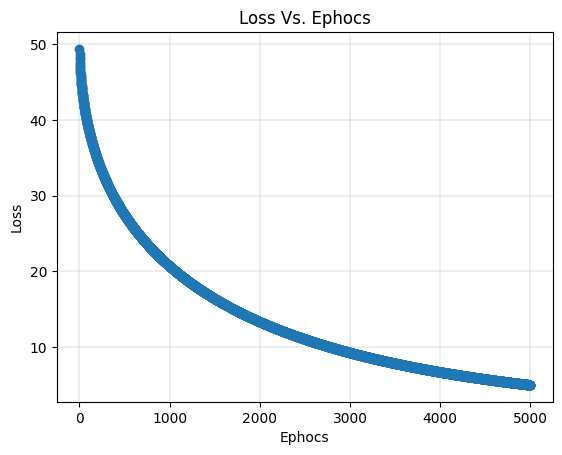

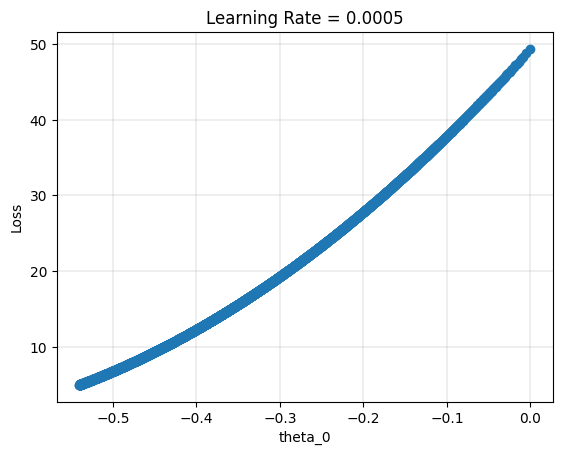

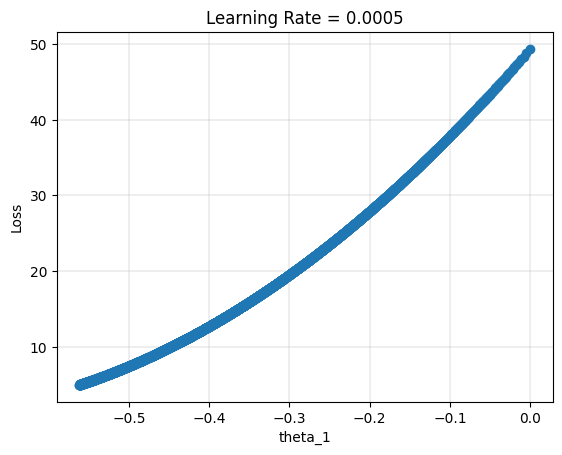

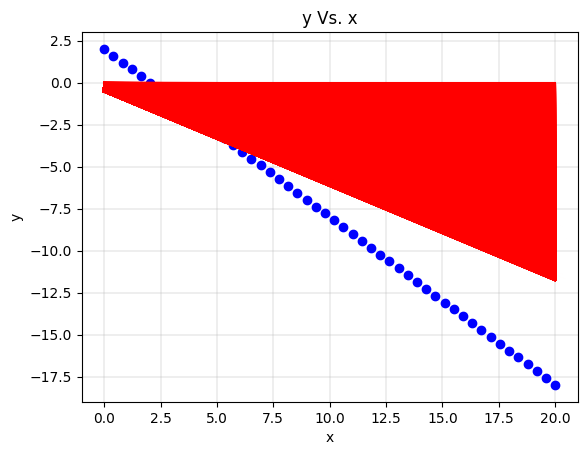

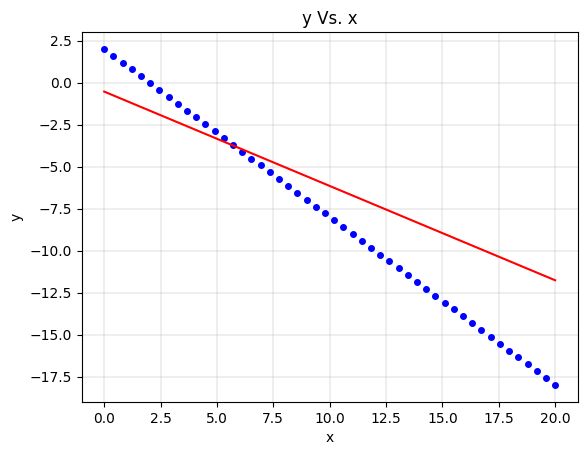

In [12]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

##### The following results uses alpha = 0.0005, epsilon =  1e-08, and max. iterations = 5000.

In [13]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = Adagrad_single_var(X, y, 0.0005, 1e-08, 5000)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

V_t_0:  64.0
V_t_1:  13154.685547688467

the


Gradient Vector:
 [[7.83108936996662], [112.47201356686121]]

Gradient Vector Norm:
 112.74431159266801

V_t_0:  16247.626446339142
V_t_1:  3347250.82981833

theta_0_new:  -0.015381780645656127
theta_1_new:  -0.015386694396761656

****************** Iteration 261 ********************

h(x):
 [-0.01538178 -0.02166206 -0.02794235 -0.03422263 -0.04050291 -0.0467832
 -0.05306348 -0.05934376 -0.06562405 -0.07190433 -0.07818461 -0.0844649
 -0.09074518 -0.09702547 -0.10330575 -0.10958603 -0.11586632 -0.1221466
 -0.12842688 -0.13470717 -0.14098745 -0.14726773 -0.15354802 -0.1598283
 -0.16610858 -0.17238887 -0.17866915 -0.18494943 -0.19122972 -0.19751
 -0.20379028 -0.21007057 -0.21635085 -0.22263113 -0.22891142 -0.2351917
 -0.24147198 -0.24775227 -0.25403255 -0.26031283 -0.26659312 -0.2728734
 -0.27915368 -0.28543397 -0.29171425 -0.29799453 -0.30427482 -0.3105551
 -0.31683539 -0.32311567]

Error Vector:
 [-2.01538178e+00 -1.61349880e+00 -1.21161582e+00 -8.09732835e-01
 -4.07849853e-01 -5.96687


Gradient Vector:
 [[7.708834722275912], [110.8638472079244]]

Gradient Vector Norm:
 111.13153805521353

V_t_0:  45668.738518890284
V_t_1:  9424797.124481991

theta_0_new:  -0.026474486292735636
theta_1_new:  -0.026488938880248437

****************** Iteration 749 ********************

h(x):
 [-0.02647449 -0.0372863  -0.04809811 -0.05890992 -0.06972173 -0.08053355
 -0.09134536 -0.10215717 -0.11296898 -0.12378079 -0.1345926  -0.14540442
 -0.15621623 -0.16702804 -0.17783985 -0.18865166 -0.19946347 -0.21027529
 -0.2210871  -0.23189891 -0.24271072 -0.25352253 -0.26433435 -0.27514616
 -0.28595797 -0.29676978 -0.30758159 -0.3183934  -0.32920522 -0.34001703
 -0.35082884 -0.36164065 -0.37245246 -0.38326428 -0.39407609 -0.4048879
 -0.41569971 -0.42651152 -0.43732333 -0.44813515 -0.45894696 -0.46975877
 -0.48057058 -0.49138239 -0.5021942  -0.51300602 -0.52381783 -0.53462964
 -0.54544145 -0.55625326]

Error Vector:
 [-2.02647449 -1.62912303 -1.23177158 -0.83442013 -0.43706867 -0.03971722
  0.357

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [14]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  -1.4736441832884104


<Figure size 640x480 with 0 Axes>

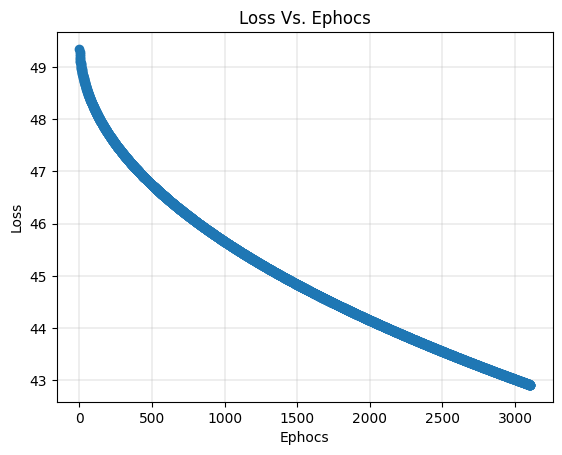

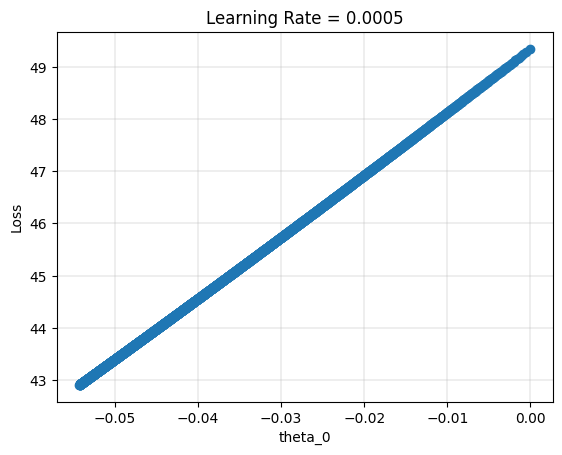

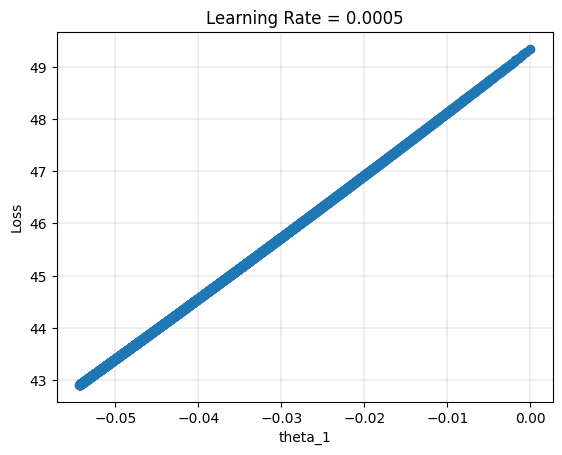

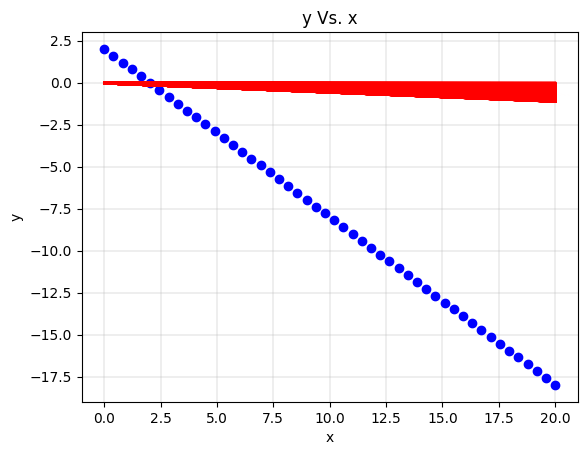

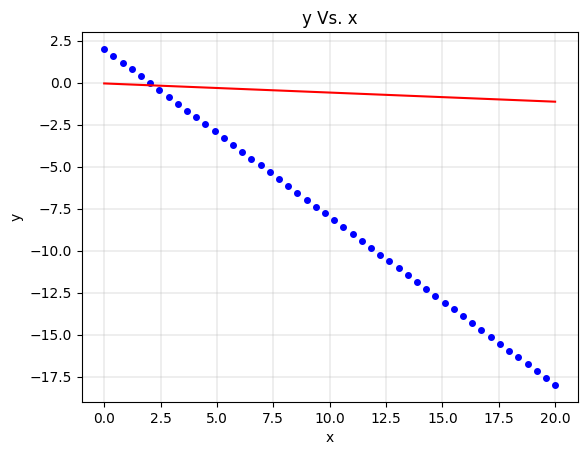

In [15]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

## RMSProp

### Update the previos implementation to be RMSProp.
#### Compare your results with Adagrad results.

In [16]:
def RMS_single_var(X, Y, LR, epsilon, Beta, Max_iter):
    # step_1
    theta_0 = 0
    theta_1 = 0
    eps = epsilon
    beta = Beta
    V_t_0 = 0
    V_t_1 = 0
    m = len(X)
    Y_pred = []
    Thetas_Cost = []
        
    for i in range(Max_iter):
        print(f"\n****************** Iteration {i} ********************")
    # step_2:
        y_pred = theta_0 + (theta_1*X)
        print("\nh(x):\n", y_pred)
        Y_pred.append(y_pred)
        
    # step_3
        Error = y_pred - Y
        cost = (1/(2*m)) * (Error @ Error)   
        print("\nError Vector:\n", Error)
        print("\nj: ", cost)
        
        Thetas_Cost.append([i, theta_0, theta_1, cost])         # append values of thetas and cost 
    
    # step_4
        d_theta_0 = (1/m) * sum(Error * 1)
        d_theta_1 = (1/m) * sum(Error * X)
        GV = [[d_theta_0], 
             [d_theta_1]]
        GV_norm = np.linalg.norm(GV)
        print("\nGradient Vector:\n", GV)
        print("\nGradient Vector Norm:\n", GV_norm)
        
        if (GV_norm < 0.001) or ((i > 0) and (abs(Thetas_Cost[i][3] - Thetas_Cost[i-1][3])) < 0.001):       # (Gradient Check, convergence check)
            break
    
    # step_5
        V_t_0 = (beta * V_t_0) + ((1 - beta)*(d_theta_0)**2)
        V_t_1 = (beta * V_t_1) + ((1 - beta)*(d_theta_1)**2)
        theta_0 = theta_0 - ((LR/(np.sqrt(V_t_0) + eps)) * d_theta_0)
        theta_1 = theta_1 - ((LR/(np.sqrt(V_t_1) + eps)) * d_theta_1)

        print("\nV_t_0: ", V_t_0)
        print("V_t_1: ", V_t_1)
        print("\ntheta_0_new: ", theta_0)
        print("theta_1_new: ", theta_1)
    
    return np.array(Thetas_Cost), Error, np.array(Y_pred), [theta_0, theta_1]
    

##### The following results uses alpha = 0.05, beta = 0.9, epsilon =  1e-08, and max. iterations = 500.

In [17]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = RMS_single_var(X, y, 0.05, 1e-08, 0.9, 500)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

V_t_0:  6.399999999999999
V_t_1:  1315.46855

In [18]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.9993602095484941


<Figure size 640x480 with 0 Axes>

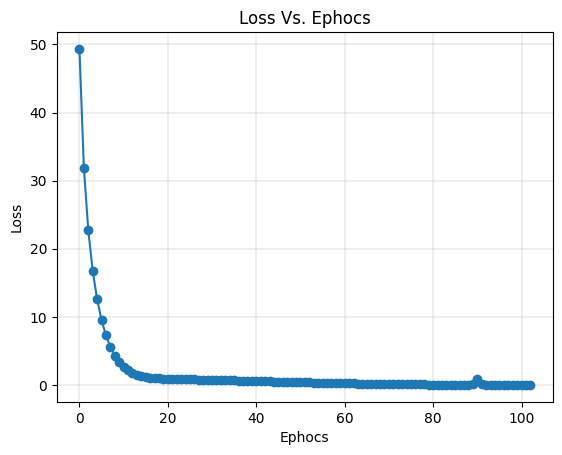

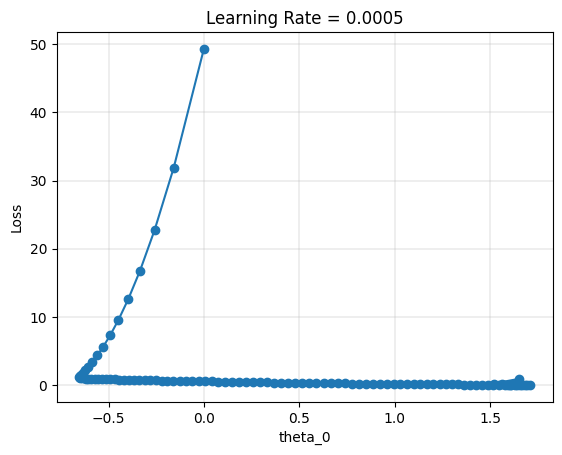

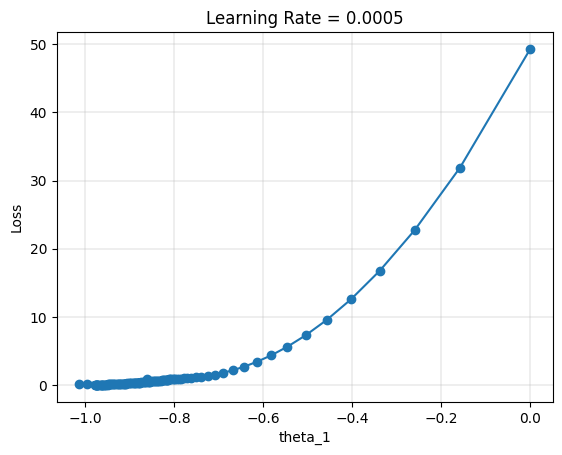

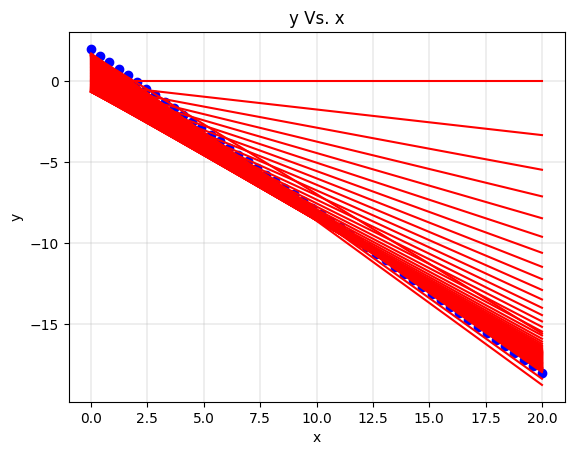

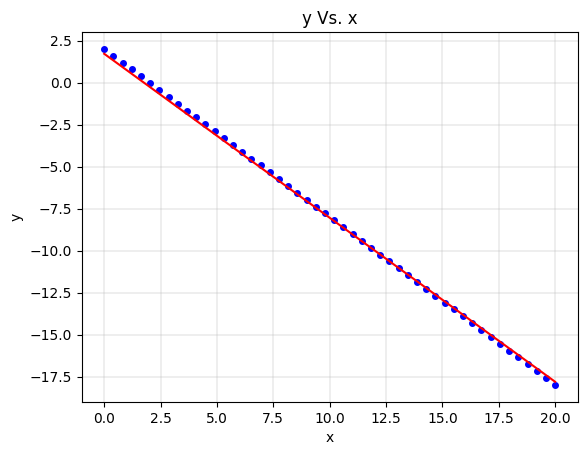

In [19]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

##### The following results uses alpha = 0.005, beta = 0.9, epsilon =  1e-08, and max. iterations = 5000.

In [20]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = RMS_single_var(X, y, 0.005, 1e-08, 0.9, 5000)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

V_t_0:  6.399999999999999
V_t_1:  1315.46855


Gradient Vector:
 [[0.24485691139797183], [12.574444342831175]]

Gradient Vector Norm:
 12.576828115149635

V_t_0:  0.5288368375016844
V_t_1:  329.2124886099378

theta_0_new:  -0.6754612459311842
theta_1_new:  -0.7116016764867064

****************** Iteration 151 ********************

h(x):
 [ -0.67546125  -0.96591091  -1.25636057  -1.54681024  -1.8372599
  -2.12770957  -2.41815923  -2.70860889  -2.99905856  -3.28950822
  -3.57995788  -3.87040755  -4.16085721  -4.45130688  -4.74175654
  -5.0322062   -5.32265587  -5.61310553  -5.9035552   -6.19400486
  -6.48445452  -6.77490419  -7.06535385  -7.35580351  -7.64625318
  -7.93670284  -8.22715251  -8.51760217  -8.80805183  -9.0985015
  -9.38895116  -9.67940083  -9.96985049 -10.26030015 -10.55074982
 -10.84119948 -11.13164915 -11.42209881 -11.71254847 -12.00299814
 -12.2934478  -12.58389746 -12.87434713 -13.16479679 -13.45524646
 -13.74569612 -14.03614578 -14.32659545 -14.61704511 -14.90749478]

Error Vector:
 [-2.67546125 -2.55774764 -2.440


Gradient Vector:
 [[-0.5284623353960024], [-0.13469869712783358]]

Gradient Vector Norm:
 0.5453587616790738

V_t_0:  0.27980994334572146
V_t_1:  0.08966387036892796

theta_0_new:  -0.007857188342067676
theta_1_new:  -0.8493118129526934

****************** Iteration 295 ********************

h(x):
 [-7.85718834e-03 -3.54515071e-01 -7.01172954e-01 -1.04783084e+00
 -1.39448872e+00 -1.74114660e+00 -2.08780449e+00 -2.43446237e+00
 -2.78112025e+00 -3.12777813e+00 -3.47443602e+00 -3.82109390e+00
 -4.16775178e+00 -4.51440967e+00 -4.86106755e+00 -5.20772543e+00
 -5.55438331e+00 -5.90104120e+00 -6.24769908e+00 -6.59435696e+00
 -6.94101485e+00 -7.28767273e+00 -7.63433061e+00 -7.98098849e+00
 -8.32764638e+00 -8.67430426e+00 -9.02096214e+00 -9.36762002e+00
 -9.71427791e+00 -1.00609358e+01 -1.04075937e+01 -1.07542516e+01
 -1.11009094e+01 -1.14475673e+01 -1.17942252e+01 -1.21408831e+01
 -1.24875410e+01 -1.28341989e+01 -1.31808567e+01 -1.35275146e+01
 -1.38741725e+01 -1.42208304e+01 -1.45674883e+01 


Gradient Vector:
 [[-0.28733172680738156], [-0.3126282124515311]]

Gradient Vector Norm:
 0.4246126710906676

V_t_0:  0.0761350027650543
V_t_1:  0.11389992201310255

theta_0_new:  0.9797939961030192
theta_1_new:  -0.921560246098631

****************** Iteration 499 ********************

h(x):
 [  0.979794     0.60364696   0.22749992  -0.14864712  -0.52479416
  -0.9009412   -1.27708824  -1.65323528  -2.02938232  -2.40552936
  -2.7816764   -3.15782344  -3.53397047  -3.91011751  -4.28626455
  -4.66241159  -5.03855863  -5.41470567  -5.79085271  -6.16699975
  -6.54314679  -6.91929383  -7.29544087  -7.67158791  -8.04773495
  -8.42388198  -8.80002902  -9.17617606  -9.5523231   -9.92847014
 -10.30461718 -10.68076422 -11.05691126 -11.4330583  -11.80920534
 -12.18535238 -12.56149942 -12.93764646 -13.31379349 -13.68994053
 -14.06608757 -14.44223461 -14.81838165 -15.19452869 -15.57067573
 -15.94682277 -16.32296981 -16.69911685 -17.07526389 -17.45141093]

Error Vector:
 [-1.020206   -0.98818978 -0

In [21]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.9948527070941069


<Figure size 640x480 with 0 Axes>

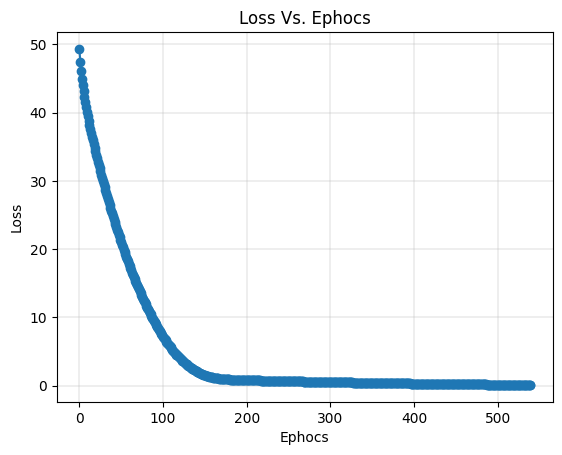

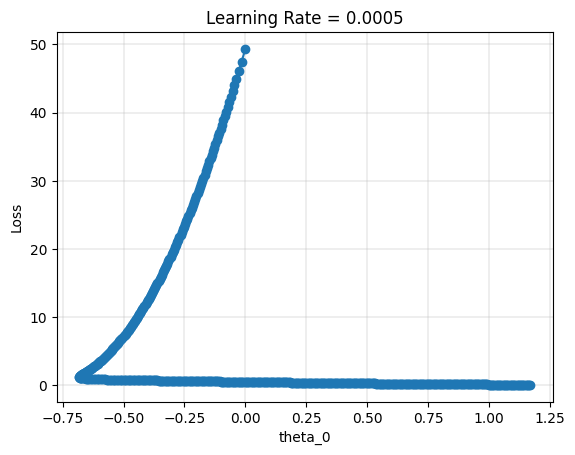

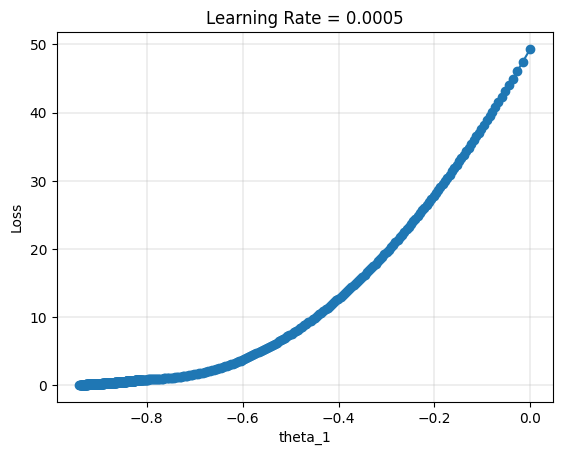

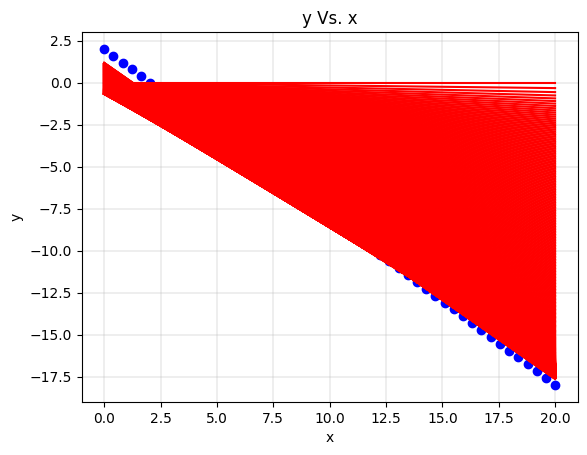

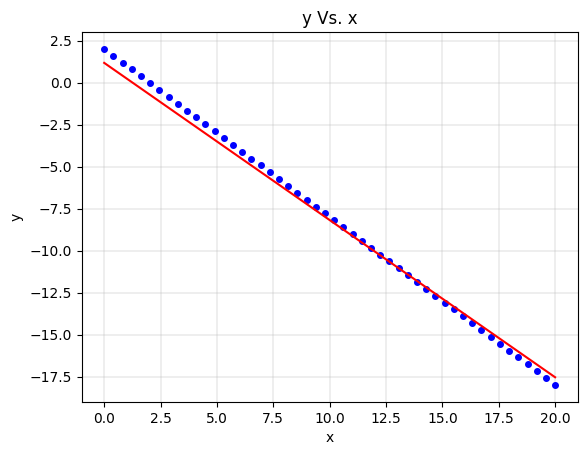

In [22]:
all_plots(theta_cost_vec, X, y, y_pred_GD)

##### The following results uses alpha = 0.0005, beta = 0.9, epsilon =  1e-08, and max. iterations = 5000.

In [23]:
theta_cost_vec, Error_vec, y_pred_GD, thetas_opt = RMS_single_var(X, y, 0.0005, 1e-08, 0.9, 5000)
training_report((theta_cost_vec[-1][0] + 1), thetas_opt[0], thetas_opt[1], 
                Error_vec, theta_cost_vec[-1][3], y_pred_GD[-1], y)


****************** Iteration 0 ********************

h(x):
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0.]

Error Vector:
 [-2.         -1.59183673 -1.18367347 -0.7755102  -0.36734694  0.04081633
  0.44897959  0.85714286  1.26530612  1.67346939  2.08163265  2.48979592
  2.89795918  3.30612245  3.71428571  4.12244898  4.53061224  4.93877551
  5.34693878  5.75510204  6.16326531  6.57142857  6.97959184  7.3877551
  7.79591837  8.20408163  8.6122449   9.02040816  9.42857143  9.83673469
 10.24489796 10.65306122 11.06122449 11.46938776 11.87755102 12.28571429
 12.69387755 13.10204082 13.51020408 13.91836735 14.32653061 14.73469388
 15.14285714 15.55102041 15.95918367 16.36734694 16.7755102  17.18367347
 17.59183673 18.        ]

j:  49.34693877551021

Gradient Vector:
 [[8.0], [114.69387755102042]]

Gradient Vector Norm:
 114.97254258164628

V_t_0:  6.399999999999999
V_t_1:  1315.46855


Gradient Vector:
 [[6.375452724412227], [93.3243212943412]]

Gradient Vector Norm:
 93.54183739103398

V_t_0:  41.27829814214952
V_t_1:  8831.003258990988

theta_0_new:  -0.1481017188146208
theta_1_new:  -0.14819071787583496

****************** Iteration 289 ********************

h(x):
 [-0.14810172 -0.20858773 -0.26907373 -0.32955974 -0.39004575 -0.45053176
 -0.51101776 -0.57150377 -0.63198978 -0.69247578 -0.75296179 -0.8134478
 -0.87393381 -0.93441981 -0.99490582 -1.05539183 -1.11587784 -1.17636384
 -1.23684985 -1.29733586 -1.35782186 -1.41830787 -1.47879388 -1.53927989
 -1.59976589 -1.6602519  -1.72073791 -1.78122392 -1.84170992 -1.90219593
 -1.96268194 -2.02316794 -2.08365395 -2.14413996 -2.20462597 -2.26511197
 -2.32559798 -2.38608399 -2.44657    -2.507056   -2.56754201 -2.62802802
 -2.68851403 -2.74900003 -2.80948604 -2.86997205 -2.93045805 -2.99094406
 -3.05143007 -3.11191608]

Error Vector:
 [-2.14810172 -1.80042446 -1.4527472  -1.10506994 -0.75739269 -0.40971543
 -0.06203817 


Gradient Vector:
 [[5.458354637287133], [81.2605854773544]]

Gradient Vector Norm:
 81.4437007230689

V_t_0:  30.334810043973103
V_t_1:  6709.146433755266

theta_0_new:  -0.2314050950955541
theta_1_new:  -0.23156961831577327

****************** Iteration 457 ********************

h(x):
 [-0.2314051  -0.32592331 -0.42044152 -0.51495973 -0.60947794 -0.70399615
 -0.79851436 -0.89303258 -0.98755079 -1.082069   -1.17658721 -1.27110542
 -1.36562363 -1.46014185 -1.55466006 -1.64917827 -1.74369648 -1.83821469
 -1.9327329  -2.02725111 -2.12176933 -2.21628754 -2.31080575 -2.40532396
 -2.49984217 -2.59436038 -2.6888786  -2.78339681 -2.87791502 -2.97243323
 -3.06695144 -3.16146965 -3.25598786 -3.35050608 -3.44502429 -3.5395425
 -3.63406071 -3.72857892 -3.82309713 -3.91761535 -4.01213356 -4.10665177
 -4.20116998 -4.29568819 -4.3902064  -4.48472462 -4.57924283 -4.67376104
 -4.76827925 -4.86279746]

Error Vector:
 [-2.2314051  -1.91776004 -1.60411499 -1.29046993 -0.97682488 -0.66317983
 -0.34953477 


Gradient Vector:
 [[3.12262002686844], [50.53518707149558]]

Gradient Vector Norm:
 50.631570074245715

V_t_0:  10.061001960568989
V_t_1:  2619.6530958955614

theta_0_new:  -0.4434036938610308
theta_1_new:  -0.44394052694969605

****************** Iteration 886 ********************

h(x):
 [-0.44340369 -0.62460391 -0.80580412 -0.98700434 -1.16820455 -1.34940477
 -1.53060498 -1.7118052  -1.89300541 -2.07420563 -2.25540584 -2.43660606
 -2.61780627 -2.79900649 -2.98020671 -3.16140692 -3.34260714 -3.52380735
 -3.70500757 -3.88620778 -4.067408   -4.24860821 -4.42980843 -4.61100864
 -4.79220886 -4.97340907 -5.15460929 -5.3358095  -5.51700972 -5.69820993
 -5.87941015 -6.06061036 -6.24181058 -6.42301079 -6.60421101 -6.78541122
 -6.96661144 -7.14781165 -7.32901187 -7.51021208 -7.6914123  -7.87261251
 -8.05381273 -8.23501294 -8.41621316 -8.59741337 -8.77861359 -8.9598138
 -9.14101402 -9.32221423]

Error Vector:
 [-2.44340369 -2.21644064 -1.98947759 -1.76251454 -1.53555149 -1.30858844
 -1.081625


****************** Training Report ********************

Gradient Descent converged after 1610 epochs

theta_0_Opt : -0.639019850917081
theta_1_Opt : -0.7908779506023

Error Vector:
 [-2.63901985 -2.55366391 -2.46830797 -2.38295204 -2.2975961  -2.21224016
 -2.12688422 -2.04152828 -1.95617234 -1.8708164  -1.78546047 -1.70010453
 -1.61474859 -1.52939265 -1.44403671 -1.35868077 -1.27332483 -1.1879689
 -1.10261296 -1.01725702 -0.93190108 -0.84654514 -0.7611892  -0.67583326
 -0.59047733 -0.50512139 -0.41976545 -0.33440951 -0.24905357 -0.16369763
 -0.0783417   0.00701424  0.09237018  0.17772612  0.26308206  0.348438
  0.43379394  0.51914987  0.60450581  0.68986175  0.77521769  0.86057363
  0.94592957  1.03128551  1.11664144  1.20199738  1.28735332  1.37270926
  1.4580652   1.54342114]

Cost =  0.9086589414595336

h(x) = y_predict:
 [ -0.63901985  -0.96182718  -1.2846345   -1.60744183  -1.93024916
  -2.25305648  -2.57586381  -2.89867114  -3.22147847  -3.54428579
  -3.86709312  -4.18990045  -

In [24]:
score = r2_score(y,y_pred_GD[-1])
print("r2_score: ", score)

r2_score:  0.9476184845511563


<Figure size 640x480 with 0 Axes>

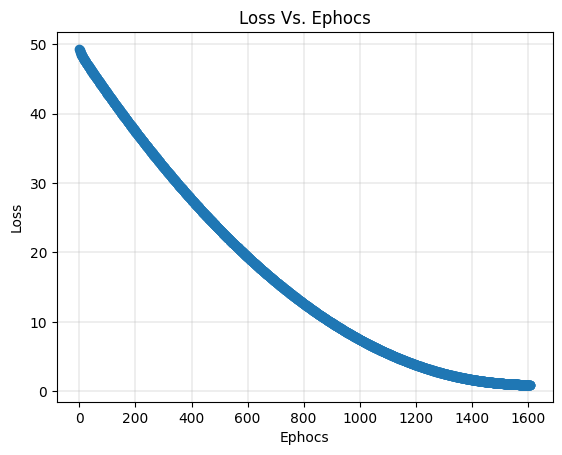

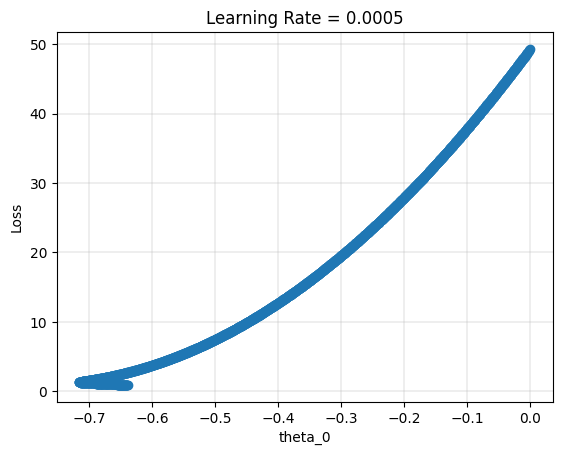

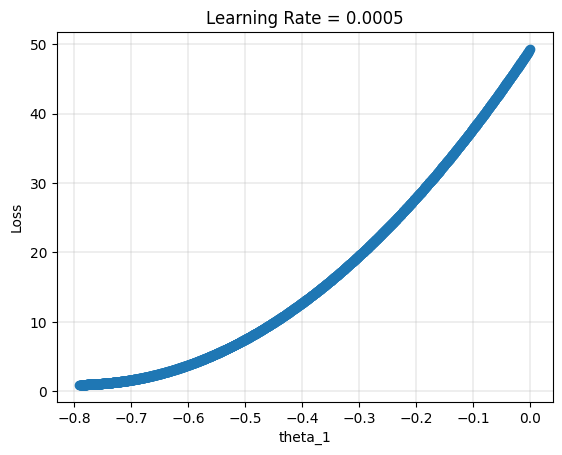

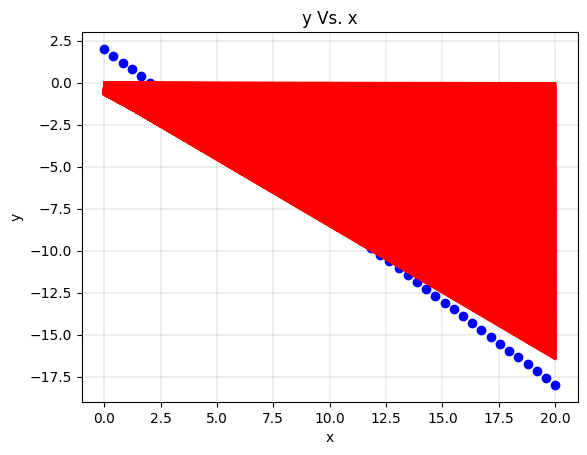

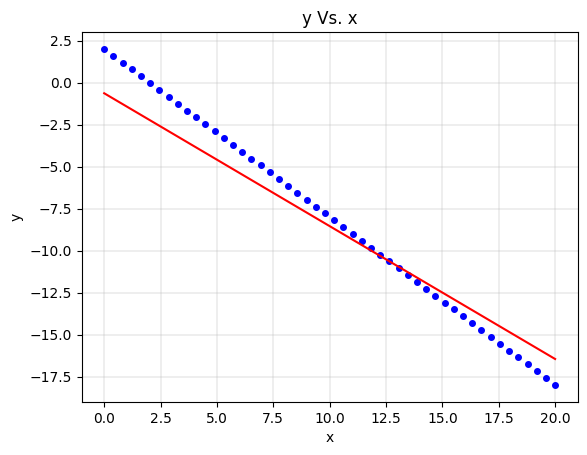

In [25]:
all_plots(theta_cost_vec, X, y, y_pred_GD)